💡 **Environment:** `clamp-analyses`

# Alzheimer's LV CLAMP pathway networks

This notebook focuses on which Alzheimer-associated LVs are interconnected, which mechanisms they share, and which mechanisms look unique.

The plots use only CLAMP model outputs:
- AD traits connect to associated LVs.
- LVs connect to significant CLAMP pathways.
- LVs connect to their top 10 loading genes.
- CLAMP pathways connect to those top LV genes when the gene is a pathway member.


## Libraries


In [1]:
library(here)
library(dplyr)
library(purrr)
library(tibble)
library(stringr)
library(readr)
library(ggplot2)
library(ggrepel)
library(cowplot)
library(igraph)


here() starts at /home/msubirana/Documents/pivlab/clamp-analyses




Attaching package: ‘dplyr’




The following objects are masked from ‘package:stats’:

    filter, lag




The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union





Attaching package: ‘igraph’




The following object is masked from ‘package:tibble’:

    as_data_frame




The following objects are masked from ‘package:purrr’:

    compose, simplify




The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union




The following objects are masked from ‘package:stats’:

    decompose, spectrum




The following object is masked from ‘package:base’:

    union




## Parameters


In [2]:
# Alzheimer's trait filter
ALZ_PATTERN <- "alzheimer"
FDR_ALZ <- 0.05
MIN_N_CASES <- 1000

# CLAMP pathway association filter
FDR_CLAMP <- 0.05
AUC_CLAMP <- 0.70
TOP_CLAMP_PATHWAYS_PER_LV <- 4

# Gene selection for detailed networks
TOP_GENES_PER_LV <- 10
MIN_SHARED_GENE_DEGREE <- 2
LVS_PER_DETAIL_CHUNK <- 10
NETWORK_LABEL_GENES <- 30
NETWORK_WRAP <- 32

FIG_DPI <- 150
SUMMARY_FIG_W <- 18
SUMMARY_FIG_H <- 14
DETAIL_FIG_W <- 22
DETAIL_FIG_H <- 14


## Inputs


In [3]:
model_path <- here('output/01_model_building/04_archs4/06_bp_coverage_rshall/06_bp_coverage_hall_rs_100/hall_coverage_rs100_seed_1/CLAMPfull_hall.rds')
trait_path <- here('data/archs4/traits/hall_coverage_rs100_seed_1_CLAMPfull_hall/gls-summary-phenomexcan.tsv.gz')
phenotype_info_path <- here('data/gtex/phenomexcan_simplified_phenotypes_info.tsv.gz')

archs4_CLAMPfull <- readRDS(model_path)

Z_mat <- data.frame(as.matrix(archs4_CLAMPfull$Z))
prior_mat <- archs4_CLAMPfull$priorMat

summary_sig <- data.frame(as.matrix(archs4_CLAMPfull$summary)) %>%
  dplyr::mutate(FDR = as.numeric(FDR), AUC = as.numeric(AUC)) %>%
  dplyr::filter(FDR < FDR_CLAMP, AUC > AUC_CLAMP)

archs4_CLAMPfull <- NULL

cat("Genes:", nrow(Z_mat), "| LVs:", ncol(Z_mat), "\n")
cat("CLAMP pathways:", ncol(prior_mat), "\n")
cat("Significant CLAMP LV-pathway associations:", nrow(summary_sig), "\n")


Genes: 18423 | LVs: 1728 


CLAMP pathways: 2953 


Significant CLAMP LV-pathway associations: 1794 


In [4]:
traits_all <- readr::read_tsv(trait_path, show_col_types = FALSE) %>%
  dplyr::select(!phenotype) %>%
  dplyr::rename(phenotype = phenotype_desc, LV = lv, FDR = fdr)

desc_to_n <- readr::read_tsv(phenotype_info_path, show_col_types = FALSE) %>%
  dplyr::mutate(
    n_eff = dplyr::case_when(
      type == "binary" ~ n_cases,
      TRUE ~ n
    )
  ) %>%
  dplyr::filter(!is.na(n_eff)) %>%
  dplyr::group_by(description) %>%
  dplyr::summarize(n_eff = max(n_eff, na.rm = TRUE), .groups = "drop")

cat("Trait associations loaded.\n")


Trait associations loaded.


## Identify Alzheimer-associated LVs


In [5]:
alz_traits <- traits_all %>%
  dplyr::filter(
    FDR < FDR_ALZ,
    stringr::str_detect(phenotype, stringr::regex(ALZ_PATTERN, ignore_case = TRUE))
  ) %>%
  dplyr::left_join(desc_to_n, by = c("phenotype" = "description")) %>%
  dplyr::filter(!is.na(n_eff), n_eff >= MIN_N_CASES)

alz_traits_summary <- alz_traits %>%
  dplyr::distinct(phenotype, n_eff) %>%
  dplyr::arrange(dplyr::desc(n_eff))

cat("Alzheimer's traits meeting criteria:\n")
print(alz_traits_summary)

LVS <- sort(unique(alz_traits$LV))
cat("\nLVs significantly associated:", length(LVS), "\n")
print(LVS)


Alzheimer's traits meeting criteria:


# A tibble: 4 × 2
  phenotype                                            n_eff
  <chr>                                                <dbl>
1 Alzheimer’s disease                                 361194
2 Illnesses of mother: Alzheimer's disease/dementia    28507
3 Illnesses of father: Alzheimer's disease/dementia    15022
4 Illnesses of siblings: Alzheimer's disease/dementia   1609



LVs significantly associated: 59 


 [1] "LV1013" "LV1028" "LV1074" "LV1110" "LV1115" "LV1127" "LV1197" "LV1212"
 [9] "LV1228" "LV1274" "LV1309" "LV1331" "LV1366" "LV1475" "LV1516" "LV1525"
[17] "LV1566" "LV1583" "LV1587" "LV1620" "LV167"  "LV173"  "LV208"  "LV209" 
[25] "LV226"  "LV257"  "LV277"  "LV291"  "LV352"  "LV430"  "LV443"  "LV461" 
[33] "LV466"  "LV556"  "LV574"  "LV584"  "LV6"    "LV603"  "LV605"  "LV651" 
[41] "LV664"  "LV669"  "LV676"  "LV678"  "LV702"  "LV727"  "LV74"   "LV749" 
[49] "LV752"  "LV759"  "LV778"  "LV796"  "LV828"  "LV830"  "LV906"  "LV91"  
[57] "LV922"  "LV946"  "LV976" 


## Build CLAMP network tables


In [6]:
clean_text <- function(x) {
  stringr::str_replace_all(x, c("‘" = "'", "’" = "'", "“" = "\"", "”" = "\""))
}

clean_pathway_label <- function(x, wrap = NETWORK_WRAP) {
  x %>%
    stringr::str_replace('^[A-Z0-9]+_', '') %>%
    stringr::str_replace_all('_', ' ') %>%
    stringr::str_to_sentence() %>%
    stringr::str_wrap(width = wrap)
}

trait_node_id <- function(x) {
  paste0("trait::", make.unique(stringr::str_replace_all(x, "[^A-Za-z0-9]+", "_")))
}

get_top_lv_gene_table <- function(lv_name) {
  lv_vec <- setNames(Z_mat[, lv_name], rownames(Z_mat))
  genes <- names(sort(lv_vec, decreasing = TRUE))[seq_len(TOP_GENES_PER_LV)]
  tibble::tibble(
    LV = lv_name,
    gene = genes,
    rank = seq_along(genes),
    loading = as.numeric(lv_vec[genes]),
    log10_loading = log10(pmax(as.numeric(lv_vec[genes]), .Machine$double.xmin))
  )
}

get_pathway_genes <- function(pathway_name) {
  if (!pathway_name %in% colnames(prior_mat)) return(character())
  rownames(prior_mat)[prior_mat[, pathway_name] != 0]
}

top_gene_table <- purrr::map_dfr(LVS, get_top_lv_gene_table)

lv_pathway_edges <- summary_sig %>%
  dplyr::filter(LV %in% LVS) %>%
  dplyr::group_by(LV) %>%
  dplyr::arrange(FDR, dplyr::desc(AUC), .by_group = TRUE) %>%
  dplyr::slice_head(n = TOP_CLAMP_PATHWAYS_PER_LV) %>%
  dplyr::ungroup() %>%
  dplyr::transmute(
    from = LV,
    to = pathway,
    edge_type = "LV-pathway",
    AUC = AUC,
    FDR = FDR,
    weight = pmin(-log10(pmax(FDR, .Machine$double.xmin)), 50)
  )

lv_gene_edges <- top_gene_table %>%
  dplyr::transmute(
    from = LV,
    to = gene,
    edge_type = "LV-gene",
    loading = loading,
    log10_loading = log10_loading,
    rank = rank
  )

pathway_gene_edges <- purrr::map_dfr(unique(lv_pathway_edges$to), function(pathway_name) {
  genes <- intersect(top_gene_table$gene, get_pathway_genes(pathway_name))
  if (length(genes) == 0) return(NULL)
  tibble::tibble(from = pathway_name, to = genes, edge_type = "Pathway-gene")
}) %>%
  dplyr::distinct()

trait_lookup <- alz_traits %>%
  dplyr::distinct(phenotype, n_eff) %>%
  dplyr::arrange(phenotype) %>%
  dplyr::mutate(
    phenotype_label = clean_text(phenotype),
    trait_node = trait_node_id(phenotype),
    trait_label = stringr::str_wrap(phenotype_label, width = NETWORK_WRAP)
  )

lv_trait_edges <- alz_traits %>%
  dplyr::distinct(LV, phenotype, FDR, n_eff) %>%
  dplyr::left_join(trait_lookup, by = c("phenotype", "n_eff")) %>%
  dplyr::transmute(
    from = trait_node,
    to = LV,
    edge_type = "Trait-LV",
    trait = phenotype,
    trait_fdr = FDR,
    n_eff = n_eff,
    weight = pmin(-log10(pmax(FDR, .Machine$double.xmin)), 50)
  )

network_edges <- dplyr::bind_rows(
  lv_trait_edges %>% dplyr::select(from, to, edge_type, trait, trait_fdr, n_eff, weight),
  lv_pathway_edges %>% dplyr::select(from, to, edge_type, AUC, FDR, weight),
  lv_gene_edges %>% dplyr::select(from, to, edge_type, loading, log10_loading, rank),
  pathway_gene_edges
)

node_names <- unique(c(network_edges$from, network_edges$to))
node_type <- dplyr::case_when(
  node_names %in% trait_lookup$trait_node ~ "Trait",
  node_names %in% LVS ~ "LV",
  node_names %in% colnames(prior_mat) ~ "CLAMP pathway",
  TRUE ~ "Gene"
)

gene_stats <- top_gene_table %>%
  dplyr::group_by(gene) %>%
  dplyr::summarize(
    n_lvs = dplyr::n_distinct(LV),
    max_loading = max(loading, na.rm = TRUE),
    max_log10_loading = max(log10_loading, na.rm = TRUE),
    .groups = "drop"
  ) %>%
  dplyr::left_join(
    pathway_gene_edges %>% dplyr::count(to, name = "n_pathways"),
    by = c("gene" = "to")
  ) %>%
  dplyr::mutate(
    n_pathways = tidyr::replace_na(n_pathways, 0L),
    gene_degree = n_lvs + n_pathways
  )

node_df <- tibble::tibble(name = node_names, type = node_type) %>%
  dplyr::left_join(gene_stats, by = c("name" = "gene")) %>%
  dplyr::mutate(
    label = dplyr::case_when(
      type == "Trait" ~ trait_lookup$trait_label[match(name, trait_lookup$trait_node)],
      type == "CLAMP pathway" ~ clean_pathway_label(name),
      TRUE ~ name
    ),
    n_lvs = dplyr::if_else(is.na(n_lvs), 0L, n_lvs),
    n_pathways = dplyr::if_else(is.na(n_pathways), 0L, n_pathways),
    gene_degree = dplyr::if_else(is.na(gene_degree), 0L, gene_degree)
  )

cat("AD trait nodes:", nrow(trait_lookup), "\n")
cat("AD LVs:", length(LVS), "\n")
cat("LV-pathway edges:", nrow(lv_pathway_edges), "\n")
cat("LV-top gene edges:", nrow(lv_gene_edges), "\n")
cat("Pathway-top gene edges:", nrow(pathway_gene_edges), "\n")
cat("Trait-LV edges:", nrow(lv_trait_edges), "\n")
cat("Network nodes:", nrow(node_df), "\n")


AD trait nodes: 4 


AD LVs: 59 


LV-pathway edges: 52 


LV-top gene edges: 590 


Pathway-top gene edges: 353 


Trait-LV edges: 150 


Network nodes: 577 


## LV-LV shared mechanism summary


In [7]:
shared_label <- function(n_genes, n_paths, n_traits) {
  paste0("G", n_genes, " / P", n_paths, " / T", n_traits)
}

lv_pairs <- utils::combn(LVS, 2, simplify = FALSE)

lv_shared_edges <- purrr::map_dfr(lv_pairs, function(pair) {
  lv_a <- pair[1]
  lv_b <- pair[2]

  genes_a <- top_gene_table %>% dplyr::filter(LV == lv_a) %>% dplyr::pull(gene)
  genes_b <- top_gene_table %>% dplyr::filter(LV == lv_b) %>% dplyr::pull(gene)

  paths_a <- lv_pathway_edges %>% dplyr::filter(from == lv_a) %>% dplyr::pull(to)
  paths_b <- lv_pathway_edges %>% dplyr::filter(from == lv_b) %>% dplyr::pull(to)

  traits_a <- lv_trait_edges %>% dplyr::filter(to == lv_a) %>% dplyr::pull(trait)
  traits_b <- lv_trait_edges %>% dplyr::filter(to == lv_b) %>% dplyr::pull(trait)

  shared_genes <- intersect(genes_a, genes_b)
  shared_paths <- intersect(paths_a, paths_b)
  shared_traits <- intersect(traits_a, traits_b)

  tibble::tibble(
    from = lv_a,
    to = lv_b,
    edge_type = "LV-LV shared",
    n_shared_genes = length(shared_genes),
    n_shared_pathways = length(shared_paths),
    n_shared_traits = length(shared_traits),
    shared_genes = paste(shared_genes, collapse = ", "),
    shared_pathways = paste(clean_pathway_label(shared_paths, wrap = 80), collapse = "; "),
    shared_traits = paste(clean_text(shared_traits), collapse = "; "),
    shared_total = length(shared_genes) + length(shared_paths) + length(shared_traits),
    label = shared_label(length(shared_genes), length(shared_paths), length(shared_traits))
  )
}) %>%
  dplyr::filter(shared_total > 0)

lv_unique_summary <- tibble::tibble(LV = LVS) %>%
  dplyr::mutate(
    n_unique_top_genes = purrr::map_int(LV, function(lv_name) {
      lv_genes <- top_gene_table %>% dplyr::filter(LV == lv_name) %>% dplyr::pull(gene)
      sum(!lv_genes %in% (top_gene_table %>% dplyr::filter(LV != lv_name) %>% dplyr::pull(gene)))
    }),
    n_unique_pathways = purrr::map_int(LV, function(lv_name) {
      lv_paths <- lv_pathway_edges %>% dplyr::filter(from == lv_name) %>% dplyr::pull(to)
      sum(!lv_paths %in% (lv_pathway_edges %>% dplyr::filter(from != lv_name) %>% dplyr::pull(to)))
    })
  )

cat("LV-LV shared edges:", nrow(lv_shared_edges), "\n")
cat("LVs with at least one unique top gene:", sum(lv_unique_summary$n_unique_top_genes > 0), "\n")
cat("LVs with at least one unique CLAMP pathway:", sum(lv_unique_summary$n_unique_pathways > 0), "\n")


LV-LV shared edges: 1711 


LVs with at least one unique top gene: 57 


LVs with at least one unique CLAMP pathway: 25 


## Plot functions


In [8]:
centered_positions <- function(n) {
  if (n == 0) return(numeric())
  rev(seq_len(n) - mean(seq_len(n)))
}

spread_ties <- function(y) {
  if (length(y) <= 1) return(y)
  ave(seq_along(y), round(y, 3), FUN = function(i) {
    if (length(i) == 1) return(0)
    seq(-0.25, 0.25, length.out = length(i))
  }) + y
}

assign_layered_layout <- function(edges, nodes) {
  nodes <- nodes %>% dplyr::filter(name %in% unique(c(edges$from, edges$to)))

  trait_nodes <- nodes %>% dplyr::filter(type == "Trait") %>% dplyr::arrange(label)
  lv_nodes <- nodes %>% dplyr::filter(type == "LV") %>% dplyr::arrange(name)

  trait_y <- tibble::tibble(name = trait_nodes$name, x = 0, y = centered_positions(nrow(trait_nodes)))
  lv_y <- tibble::tibble(name = lv_nodes$name, x = -1.6, y = centered_positions(nrow(lv_nodes)))

  pathway_nodes <- nodes %>% dplyr::filter(type == "CLAMP pathway")
  pathway_y <- pathway_nodes %>%
    dplyr::rowwise() %>%
    dplyr::mutate(
      y_base = {
        lvs <- edges %>% dplyr::filter(to == name, edge_type == "LV-pathway") %>% dplyr::pull(from)
        vals <- lv_y$y[match(lvs, lv_y$name)]
        if (length(vals) == 0 || all(is.na(vals))) 0 else mean(vals, na.rm = TRUE)
      }
    ) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(y_base, label) %>%
    dplyr::mutate(x = 1.5, y = spread_ties(y_base)) %>%
    dplyr::select(name, x, y)

  gene_nodes <- nodes %>% dplyr::filter(type == "Gene")
  gene_y <- gene_nodes %>%
    dplyr::rowwise() %>%
    dplyr::mutate(
      y_base = {
        lvs <- edges %>% dplyr::filter(to == name, edge_type == "LV-gene") %>% dplyr::pull(from)
        vals <- lv_y$y[match(lvs, lv_y$name)]
        if (length(vals) == 0 || all(is.na(vals))) 0 else mean(vals, na.rm = TRUE)
      }
    ) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(y_base, dplyr::desc(gene_degree), label) %>%
    dplyr::mutate(x = 3.2, y = spread_ties(y_base)) %>%
    dplyr::select(name, x, y)

  nodes %>%
    dplyr::left_join(dplyr::bind_rows(trait_y, lv_y, pathway_y, gene_y), by = "name") %>%
    dplyr::mutate(
      x = dplyr::case_when(
        type == "Trait" ~ 0,
        type == "LV" ~ -1.6,
        type == "CLAMP pathway" ~ 1.5,
        TRUE ~ 3.2
      ),
      y = dplyr::if_else(is.na(y), 0, y)
    )
}

make_layered_network_plot <- function(edges, nodes, title, label_genes = NETWORK_LABEL_GENES) {
  blank <- ggplot() + theme_void() +
    annotate("text", x = 0.5, y = 0.5, label = paste(title, "\nno edges"),
             size = 5, colour = "grey60", hjust = 0.5)

  if (is.null(edges) || nrow(edges) == 0) return(blank)

  plot_nodes <- assign_layered_layout(edges, nodes)
  if (nrow(plot_nodes) == 0) return(blank)

  plot_edges <- edges %>%
    dplyr::left_join(plot_nodes %>% dplyr::select(from = name, x, y), by = "from") %>%
    dplyr::rename(x_from = x, y_from = y) %>%
    dplyr::left_join(plot_nodes %>% dplyr::select(to = name, x, y), by = "to") %>%
    dplyr::rename(x_to = x, y_to = y) %>%
    dplyr::filter(!is.na(x_from), !is.na(x_to))

  trait_nodes <- plot_nodes %>% dplyr::filter(type == "Trait")
  lv_nodes <- plot_nodes %>% dplyr::filter(type == "LV")
  pathway_nodes <- plot_nodes %>% dplyr::filter(type == "CLAMP pathway")
  gene_nodes <- plot_nodes %>% dplyr::filter(type == "Gene")
  gene_labels <- gene_nodes %>%
    dplyr::filter(gene_degree >= MIN_SHARED_GENE_DEGREE) %>%
    dplyr::arrange(dplyr::desc(gene_degree), dplyr::desc(max_log10_loading)) %>%
    dplyr::slice_head(n = label_genes)

  ggplot() +
    geom_curve(
      data = plot_edges,
      aes(x = x_from, y = y_from, xend = x_to, yend = y_to, linetype = edge_type),
      curvature = 0.12, colour = "grey70", linewidth = 0.32, alpha = 0.72
    ) +
    geom_point(
      data = gene_nodes,
      aes(x = x, y = y, size = gene_degree, fill = max_log10_loading),
      shape = 21, colour = "grey25", stroke = 0.25, alpha = 0.95
    ) +
    geom_point(data = pathway_nodes, aes(x = x, y = y), shape = 24, size = 4.6,
               fill = "#1b7837", colour = "grey10", stroke = 0.45, alpha = 0.96) +
    geom_point(data = lv_nodes, aes(x = x, y = y), shape = 22, size = 4.8,
               fill = "#762a83", colour = "grey10", stroke = 0.45, alpha = 0.98) +
    geom_point(data = trait_nodes, aes(x = x, y = y), shape = 23, size = 6.0,
               fill = "#d95f02", colour = "grey10", stroke = 0.45, alpha = 0.98) +
    ggrepel::geom_text_repel(
      data = trait_nodes,
      aes(x = x, y = y, label = label),
      size = 3.3, fontface = "bold", colour = "#8c3b00",
      box.padding = 0.35, point.padding = 0.25, seed = 42,
      min.segment.length = 0, max.overlaps = Inf, segment.colour = "grey65"
    ) +
    ggrepel::geom_text_repel(
      data = lv_nodes,
      aes(x = x, y = y, label = label),
      size = 3.4, fontface = "bold", colour = "#3f1648",
      box.padding = 0.35, point.padding = 0.25, seed = 42,
      min.segment.length = 0, max.overlaps = Inf, segment.colour = "grey65"
    ) +
    ggrepel::geom_text_repel(
      data = pathway_nodes,
      aes(x = x, y = y, label = label),
      size = 2.8, fontface = "bold", colour = "grey10",
      box.padding = 0.35, point.padding = 0.25, seed = 42,
      min.segment.length = 0, max.overlaps = Inf, segment.colour = "grey65"
    ) +
    ggrepel::geom_text_repel(
      data = gene_labels,
      aes(x = x, y = y, label = label),
      size = 2.7, fontface = "italic", colour = "grey20",
      box.padding = 0.25, point.padding = 0.15, seed = 42,
      min.segment.length = 0, max.overlaps = Inf, segment.colour = "grey70"
    ) +
    annotate("text", x = c(0, -1.6, 1.5, 3.2), y = max(plot_nodes$y, na.rm = TRUE) + 1.1,
             label = c("AD traits", "LVs", "CLAMP pathways", "Top 10 LV genes"),
             fontface = "bold", size = 4.2, colour = c("#8c3b00", "#3f1648", "#1b7837", "grey20")) +
    scale_fill_gradient(low = "#f7f7f7", high = "#b2182b", name = "log10(max loading)",
                        guide = guide_colourbar(title.position = "top", title.hjust = 0.5,
                                                barwidth = unit(4, "cm"), barheight = unit(0.35, "cm"), order = 1)) +
    scale_size_continuous(range = c(2.5, 8.5), name = "Gene connections",
                          breaks = scales::pretty_breaks(n = 4),
                          guide = guide_legend(title.position = "top", title.hjust = 0.5, order = 2)) +
    scale_linetype_manual(values = c("Trait-LV" = "longdash", "LV-pathway" = "solid",
                                     "LV-gene" = "dotted", "Pathway-gene" = "solid"),
                          name = "Edge", guide = guide_legend(title.position = "top", title.hjust = 0.5, order = 3)) +
    coord_cartesian(clip = "off") +
    labs(title = title, x = NULL, y = NULL) +
    theme_void(base_size = 13) +
    theme(
      plot.background = element_rect(fill = "white", colour = NA),
      plot.title = element_text(face = "bold", size = 18, hjust = 0.5, margin = margin(b = 8)),
      legend.position = "bottom",
      legend.box = "horizontal",
      legend.title = element_text(size = 11, face = "bold"),
      legend.text = element_text(size = 10),
      plot.margin = margin(18, 24, 16, 24)
    )
}

make_detail_plot <- function(chunk_lvs, chunk_id) {
  chunk_traits <- lv_trait_edges %>% dplyr::filter(to %in% chunk_lvs) %>% dplyr::pull(from) %>% unique()
  chunk_pathways <- lv_pathway_edges %>% dplyr::filter(from %in% chunk_lvs) %>% dplyr::pull(to) %>% unique()
  chunk_genes <- lv_gene_edges %>% dplyr::filter(from %in% chunk_lvs) %>% dplyr::pull(to) %>% unique()

  chunk_edges <- network_edges %>%
    dplyr::filter(
      from %in% chunk_traits | to %in% chunk_traits |
        from %in% chunk_lvs | to %in% chunk_lvs |
        from %in% chunk_pathways | to %in% chunk_pathways |
        from %in% chunk_genes | to %in% chunk_genes
    ) %>%
    dplyr::filter(
      edge_type != "Pathway-gene" |
        (from %in% chunk_pathways & to %in% chunk_genes)
    )

  connected <- unique(c(chunk_edges$from, chunk_edges$to))
  chunk_nodes <- node_df %>% dplyr::filter(name %in% connected)

  make_layered_network_plot(
    chunk_edges,
    chunk_nodes,
    paste0("AD trait-centered LV, CLAMP pathway, and top-gene network, LV chunk ", chunk_id)
  )
}

make_lv_shared_plot <- function() {
  edges <- lv_shared_edges %>%
    dplyr::arrange(dplyr::desc(shared_total)) %>%
    dplyr::slice_head(n = 80)

  if (nrow(edges) == 0) {
    return(ggplot() + theme_void() + annotate("text", x = 0.5, y = 0.5, label = "No LV-LV shared mechanisms"))
  }

  lv_nodes <- tibble::tibble(name = unique(c(edges$from, edges$to))) %>%
    dplyr::left_join(lv_unique_summary, by = c("name" = "LV"))

  graph <- igraph::graph_from_data_frame(edges %>% dplyr::select(from, to), vertices = lv_nodes, directed = FALSE)
  set.seed(42)
  layout <- igraph::layout_with_fr(graph, niter = 1500)

  plot_nodes <- lv_nodes %>% dplyr::mutate(x = layout[, 1], y = layout[, 2])
  plot_edges <- edges %>%
    dplyr::left_join(plot_nodes %>% dplyr::select(from = name, x, y), by = "from") %>%
    dplyr::rename(x_from = x, y_from = y) %>%
    dplyr::left_join(plot_nodes %>% dplyr::select(to = name, x, y), by = "to") %>%
    dplyr::rename(x_to = x, y_to = y)

  edge_labels <- plot_edges %>%
    dplyr::arrange(dplyr::desc(shared_total)) %>%
    dplyr::slice_head(n = 30) %>%
    dplyr::mutate(x = (x_from + x_to) / 2, y = (y_from + y_to) / 2)

  ggplot() +
    geom_segment(data = plot_edges, aes(x = x_from, y = y_from, xend = x_to, yend = y_to, linewidth = shared_total),
                 colour = "grey58", alpha = 0.6) +
    geom_point(data = plot_nodes, aes(x = x, y = y), shape = 22, size = 5.2,
               fill = "#762a83", colour = "grey10", stroke = 0.45) +
    ggrepel::geom_text_repel(data = plot_nodes, aes(x = x, y = y, label = name),
                             size = 3.4, fontface = "bold", colour = "#3f1648",
                             box.padding = 0.35, point.padding = 0.25, seed = 42,
                             min.segment.length = 0, max.overlaps = Inf) +
    ggrepel::geom_text_repel(data = edge_labels, aes(x = x, y = y, label = label),
                             size = 2.5, colour = "grey20", seed = 42,
                             min.segment.length = 0, max.overlaps = Inf) +
    scale_linewidth_continuous(range = c(0.2, 1.8), name = "Shared total") +
    labs(
      title = "AD LVs interconnected by shared top genes, CLAMP pathways, and traits",
      subtitle = "Edge labels: G = shared top-10 genes, P = shared CLAMP pathways, T = shared AD traits"
    ) +
    theme_void(base_size = 13) +
    theme(
      plot.background = element_rect(fill = "white", colour = NA),
      plot.title = element_text(face = "bold", size = 18, hjust = 0.5, margin = margin(b = 4)),
      plot.subtitle = element_text(size = 12, hjust = 0.5, colour = "grey25", margin = margin(b = 8)),
      legend.position = "bottom",
      plot.margin = margin(16, 20, 16, 20)
    )
}


## Paper mechanism network


In [9]:
# Focused paper network: data-derived CLAMP pathways, not hand-named modules.
paper_gene_nodes <- gene_stats %>%
  dplyr::filter(gene_degree >= MIN_SHARED_GENE_DEGREE) %>%
  dplyr::arrange(dplyr::desc(gene_degree), dplyr::desc(max_log10_loading)) %>%
  dplyr::slice_head(n = 35) %>%
  dplyr::pull(gene)

apo_paper_genes <- top_gene_table %>%
  dplyr::filter(stringr::str_detect(gene, "^APO")) %>%
  dplyr::pull(gene) %>%
  unique()

paper_gene_nodes <- union(paper_gene_nodes, apo_paper_genes)

paper_pathway_scores <- lv_pathway_edges %>%
  dplyr::count(to, name = "n_lvs") %>%
  dplyr::left_join(
    pathway_gene_edges %>%
      dplyr::filter(to %in% paper_gene_nodes) %>%
      dplyr::count(from, name = "n_paper_genes"),
    by = c("to" = "from")
  ) %>%
  dplyr::mutate(n_paper_genes = tidyr::replace_na(n_paper_genes, 0L)) %>%
  dplyr::filter(n_paper_genes > 0 | n_lvs > 1) %>%
  dplyr::arrange(dplyr::desc(n_paper_genes), dplyr::desc(n_lvs), to) %>%
  dplyr::slice_head(n = 22)

paper_pathway_nodes <- paper_pathway_scores$to
paper_lvs <- lv_pathway_edges %>%
  dplyr::filter(to %in% paper_pathway_nodes) %>%
  dplyr::pull(from) %>%
  union(lv_gene_edges %>% dplyr::filter(to %in% paper_gene_nodes) %>% dplyr::pull(from)) %>%
  unique()

paper_trait_edges <- lv_trait_edges %>%
  dplyr::filter(to %in% paper_lvs) %>%
  dplyr::select(from, to, edge_type, trait, trait_fdr, n_eff, weight)

paper_lv_pathway_edges <- lv_pathway_edges %>%
  dplyr::filter(from %in% paper_lvs, to %in% paper_pathway_nodes) %>%
  dplyr::select(from, to, edge_type, AUC, FDR, weight)

paper_lv_gene_edges <- lv_gene_edges %>%
  dplyr::filter(from %in% paper_lvs, to %in% paper_gene_nodes) %>%
  dplyr::select(from, to, edge_type, loading, log10_loading, rank)

paper_pathway_gene_edges <- pathway_gene_edges %>%
  dplyr::filter(from %in% paper_pathway_nodes, to %in% paper_gene_nodes)

paper_edges <- dplyr::bind_rows(
  paper_trait_edges,
  paper_lv_pathway_edges,
  paper_lv_gene_edges,
  paper_pathway_gene_edges
)

paper_node_names <- unique(c(paper_edges$from, paper_edges$to))
paper_nodes <- tibble::tibble(name = paper_node_names) %>%
  dplyr::mutate(
    type = dplyr::case_when(
      name %in% trait_lookup$trait_node ~ "Trait",
      name %in% LVS ~ "LV",
      name %in% colnames(prior_mat) ~ "CLAMP pathway",
      TRUE ~ "Gene"
    ),
    label = dplyr::case_when(
      type == "Trait" ~ trait_lookup$trait_label[match(name, trait_lookup$trait_node)],
      type == "CLAMP pathway" ~ clean_pathway_label(name),
      TRUE ~ name
    )
  ) %>%
  dplyr::left_join(gene_stats, by = c("name" = "gene")) %>%
  dplyr::left_join(paper_pathway_scores %>% dplyr::select(name = to, n_pathway_lvs = n_lvs, n_paper_genes), by = "name") %>%
  dplyr::mutate(
    gene_degree = dplyr::if_else(is.na(gene_degree), 0L, gene_degree),
    max_log10_loading = dplyr::if_else(is.na(max_log10_loading), NA_real_, max_log10_loading),
    n_pathway_lvs = dplyr::if_else(is.na(n_pathway_lvs), 0L, n_pathway_lvs),
    n_paper_genes = dplyr::if_else(is.na(n_paper_genes), 0L, n_paper_genes)
  )

assign_paper_layout <- function(edges, nodes) {
  nodes <- nodes %>% dplyr::filter(name %in% unique(c(edges$from, edges$to)))
  traits <- nodes %>% dplyr::filter(type == "Trait") %>% dplyr::arrange(label)
  lvs <- nodes %>% dplyr::filter(type == "LV") %>% dplyr::arrange(name)
  pathways <- nodes %>% dplyr::filter(type == "CLAMP pathway") %>%
    dplyr::arrange(dplyr::desc(n_paper_genes), dplyr::desc(n_pathway_lvs), label)
  genes <- nodes %>% dplyr::filter(type == "Gene") %>%
    dplyr::arrange(dplyr::desc(gene_degree), dplyr::desc(max_log10_loading), label)

  trait_y <- tibble::tibble(name = traits$name, x = -2.4, y = centered_positions(nrow(traits)))
  pathway_y <- tibble::tibble(name = pathways$name, x = 1.25, y = centered_positions(nrow(pathways)) * 0.65)

  lv_y <- lvs %>%
    dplyr::rowwise() %>%
    dplyr::mutate(y_base = {
      paths <- edges %>% dplyr::filter(from == name, edge_type == "LV-pathway") %>% dplyr::pull(to)
      vals <- pathway_y$y[match(paths, pathway_y$name)]
      if (length(vals) == 0 || all(is.na(vals))) 0 else mean(vals, na.rm = TRUE)
    }) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(y_base, name) %>%
    dplyr::mutate(x = -0.65, y = spread_ties(y_base)) %>%
    dplyr::select(name, x, y)

  gene_y <- genes %>%
    dplyr::rowwise() %>%
    dplyr::mutate(y_base = {
      paths <- edges %>% dplyr::filter(to == name, edge_type == "Pathway-gene") %>% dplyr::pull(from)
      vals <- pathway_y$y[match(paths, pathway_y$name)]
      if (length(vals) == 0 || all(is.na(vals))) 0 else mean(vals, na.rm = TRUE)
    }) %>%
    dplyr::ungroup() %>%
    dplyr::arrange(y_base, dplyr::desc(gene_degree), label) %>%
    dplyr::mutate(x = 3.35, y = spread_ties(y_base)) %>%
    dplyr::select(name, x, y)

  nodes %>%
    dplyr::left_join(dplyr::bind_rows(trait_y, lv_y, pathway_y, gene_y), by = "name") %>%
    dplyr::mutate(
      x = dplyr::case_when(type == "Trait" ~ -2.4, type == "LV" ~ -0.65, type == "CLAMP pathway" ~ 1.25, TRUE ~ 3.35),
      y = dplyr::if_else(is.na(y), 0, y)
    )
}

make_paper_mechanism_network <- function() {
  plot_nodes <- assign_paper_layout(paper_edges, paper_nodes)
  plot_edges <- paper_edges %>%
    dplyr::left_join(plot_nodes %>% dplyr::select(from = name, x, y), by = "from") %>%
    dplyr::rename(x_from = x, y_from = y) %>%
    dplyr::left_join(plot_nodes %>% dplyr::select(to = name, x, y), by = "to") %>%
    dplyr::rename(x_to = x, y_to = y)

  trait_nodes <- plot_nodes %>% dplyr::filter(type == "Trait")
  lv_nodes <- plot_nodes %>% dplyr::filter(type == "LV")
  pathway_nodes <- plot_nodes %>% dplyr::filter(type == "CLAMP pathway")
  gene_nodes <- plot_nodes %>% dplyr::filter(type == "Gene")

  ggplot() +
    geom_curve(
      data = plot_edges,
      aes(x = x_from, y = y_from, xend = x_to, yend = y_to, linetype = edge_type),
      curvature = 0.10, colour = "grey68", linewidth = 0.34, alpha = 0.72
    ) +
    geom_point(
      data = gene_nodes,
      aes(x = x, y = y, size = gene_degree, fill = max_log10_loading),
      shape = 21, colour = "grey20", stroke = 0.25, alpha = 0.96
    ) +
    geom_point(data = pathway_nodes, aes(x = x, y = y), shape = 24, size = 5.5,
               fill = "#1b7837", colour = "grey10", stroke = 0.5) +
    geom_point(data = lv_nodes, aes(x = x, y = y), shape = 22, size = 3.9,
               fill = "#762a83", colour = "grey10", stroke = 0.4) +
    geom_point(data = trait_nodes, aes(x = x, y = y), shape = 23, size = 6.0,
               fill = "#d95f02", colour = "grey10", stroke = 0.45) +
    ggrepel::geom_text_repel(data = trait_nodes, aes(x = x, y = y, label = label),
                             size = 3.2, fontface = "bold", colour = "#8c3b00",
                             box.padding = 0.35, point.padding = 0.2, seed = 42,
                             min.segment.length = 0, max.overlaps = Inf) +
    ggrepel::geom_text_repel(data = lv_nodes, aes(x = x, y = y, label = label),
                             size = 2.7, fontface = "bold", colour = "#3f1648",
                             box.padding = 0.25, point.padding = 0.15, seed = 42,
                             min.segment.length = 0, max.overlaps = Inf) +
    ggrepel::geom_text_repel(data = pathway_nodes, aes(x = x, y = y, label = label),
                             size = 2.65, fontface = "bold", colour = "#10461d",
                             box.padding = 0.35, point.padding = 0.25, seed = 42,
                             min.segment.length = 0, max.overlaps = Inf) +
    ggrepel::geom_text_repel(data = gene_nodes, aes(x = x, y = y, label = label),
                             size = 2.65, fontface = "italic", colour = "grey15",
                             box.padding = 0.25, point.padding = 0.15, seed = 42,
                             min.segment.length = 0, max.overlaps = Inf) +
    annotate("text", x = c(-2.4, -0.65, 1.25, 3.35), y = max(plot_nodes$y, na.rm = TRUE) + 1.05,
             label = c("AD traits", "AD LVs", "CLAMP pathways", "Shared candidate genes"),
             fontface = "bold", size = 4.1, colour = c("#8c3b00", "#3f1648", "#1b7837", "grey20")) +
    scale_fill_gradient(low = "#f7f7f7", high = "#b2182b", name = "log10(max loading)",
                        guide = guide_colourbar(title.position = "top", title.hjust = 0.5,
                                                barwidth = unit(4, "cm"), barheight = unit(0.35, "cm"), order = 1)) +
    scale_size_continuous(range = c(3, 8.5), name = "Gene connections",
                          guide = guide_legend(title.position = "top", title.hjust = 0.5, order = 2)) +
    scale_linetype_manual(values = c("Trait-LV" = "longdash", "LV-pathway" = "solid", "LV-gene" = "dotted", "Pathway-gene" = "solid"),
                          name = "Edge", guide = guide_legend(title.position = "top", title.hjust = 0.5, order = 3)) +
    coord_cartesian(clip = "off") +
    labs(
      title = "AD-associated LVs connect through CLAMP pathways and shared candidate genes",
      subtitle = "Focused network from top-10 LV genes and significant CLAMP pathway/trait associations"
    ) +
    theme_void(base_size = 13) +
    theme(
      plot.background = element_rect(fill = "white", colour = NA),
      plot.title = element_text(face = "bold", size = 20, hjust = 0.5, margin = margin(b = 4)),
      plot.subtitle = element_text(size = 12, hjust = 0.5, colour = "grey25", margin = margin(b = 8)),
      legend.position = "bottom",
      legend.box = "horizontal",
      legend.title = element_text(size = 11, face = "bold"),
      legend.text = element_text(size = 10),
      plot.margin = margin(18, 24, 16, 24)
    )
}

cat("Paper CLAMP pathway network LVs:", dplyr::n_distinct(paper_lv_pathway_edges$from), "\n")
cat("Paper CLAMP pathway network pathways:", dplyr::n_distinct(paper_lv_pathway_edges$to), "\n")
cat("Paper CLAMP pathway network genes:", dplyr::n_distinct(paper_pathway_gene_edges$to), "\n")


Paper CLAMP pathway network LVs: 16 


Paper CLAMP pathway network pathways: 22 


Paper CLAMP pathway network genes: 36 


## Render and save


[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

agg_record_269582396 
                   2

agg_record_269582396 
                   2

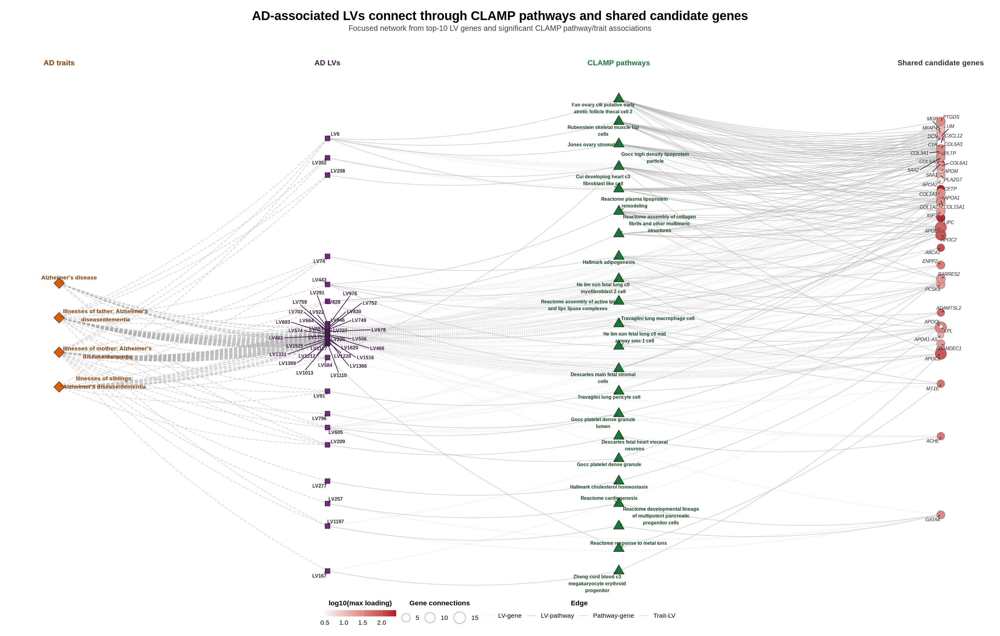

agg_record_269582396 
                   2

agg_record_269582396 
                   2

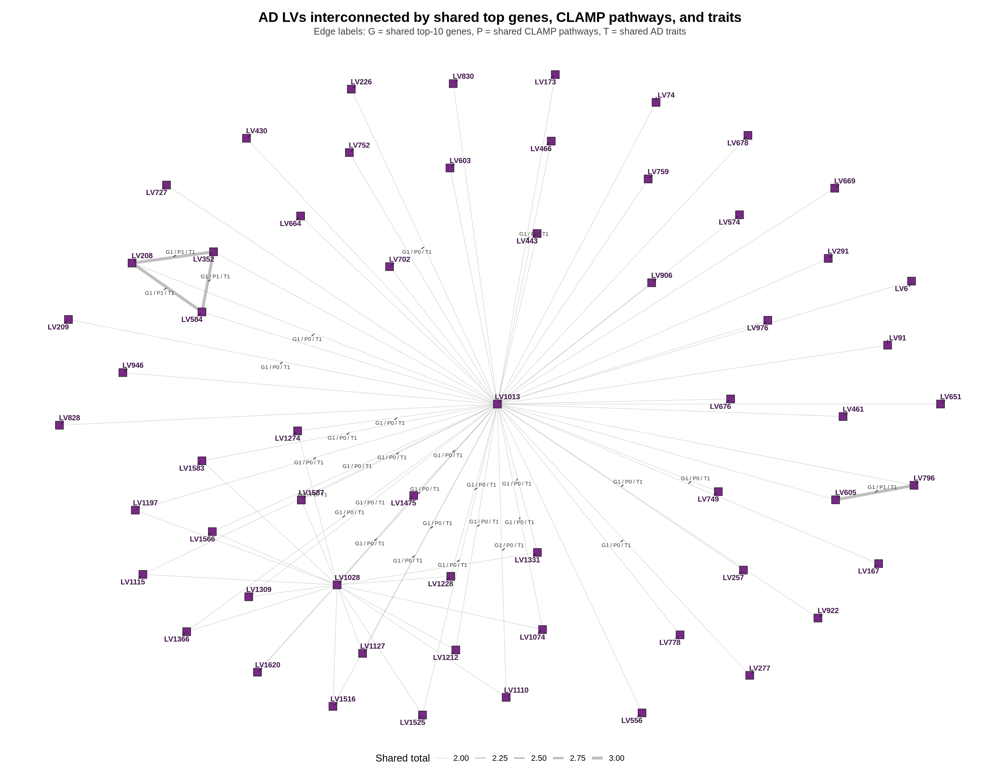

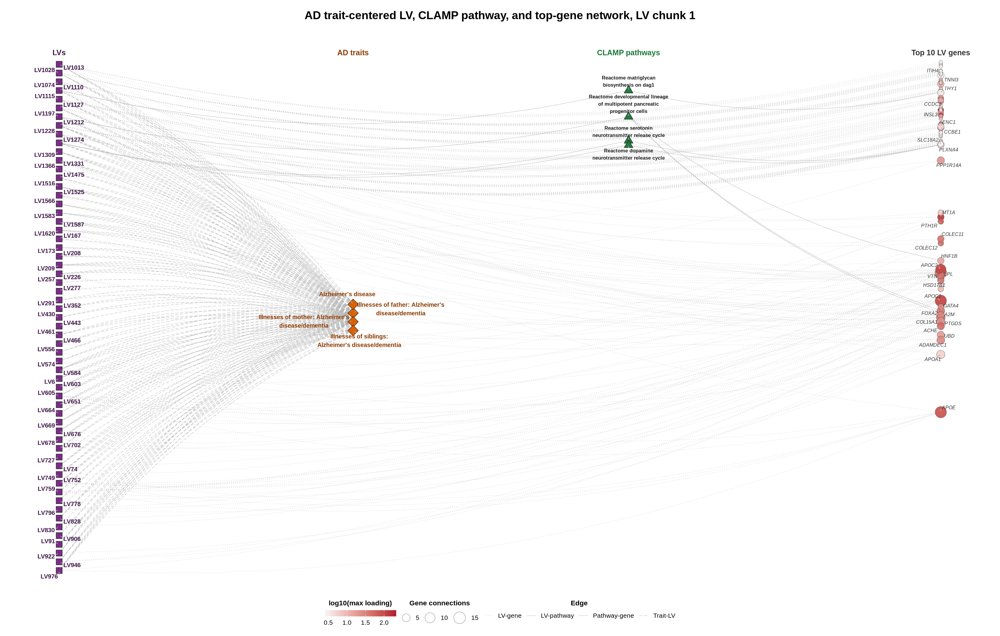

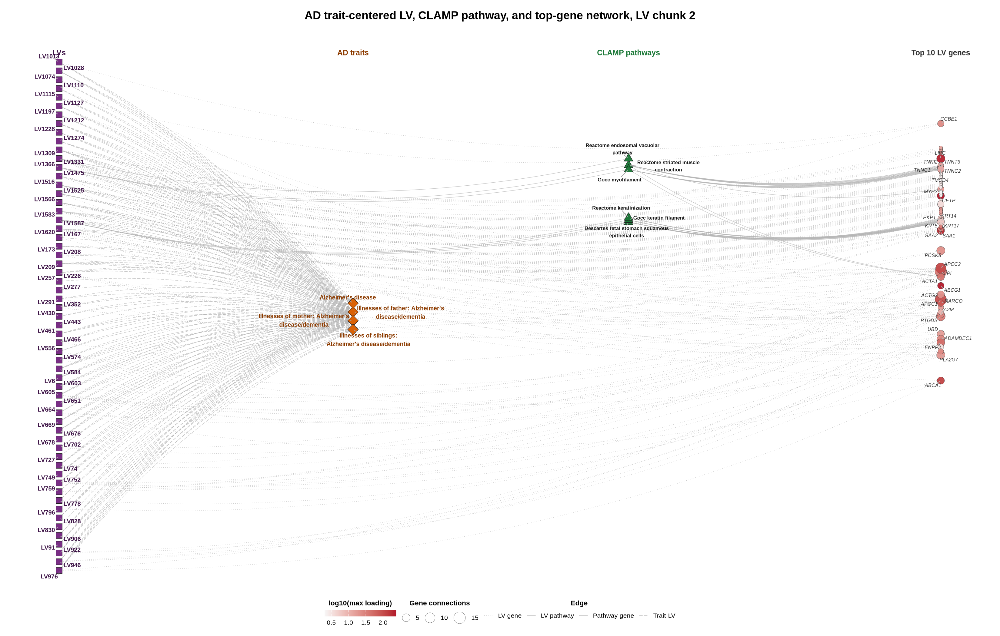

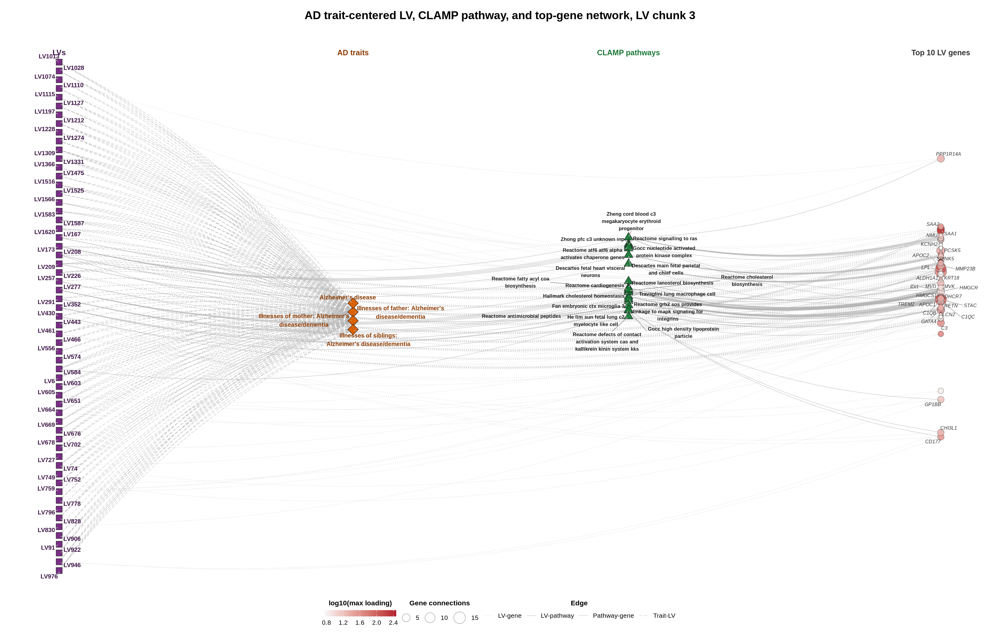

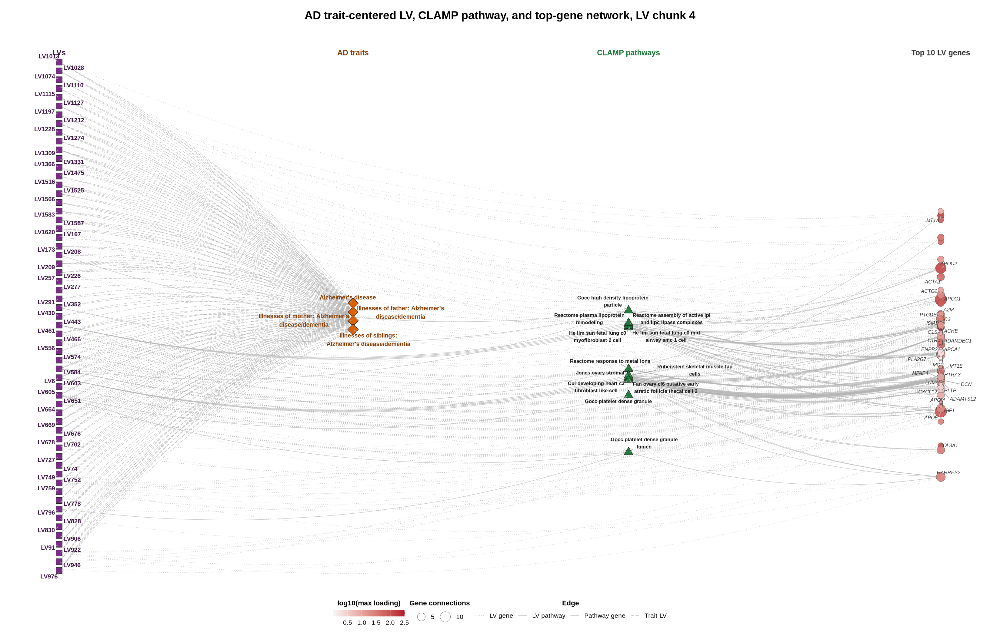

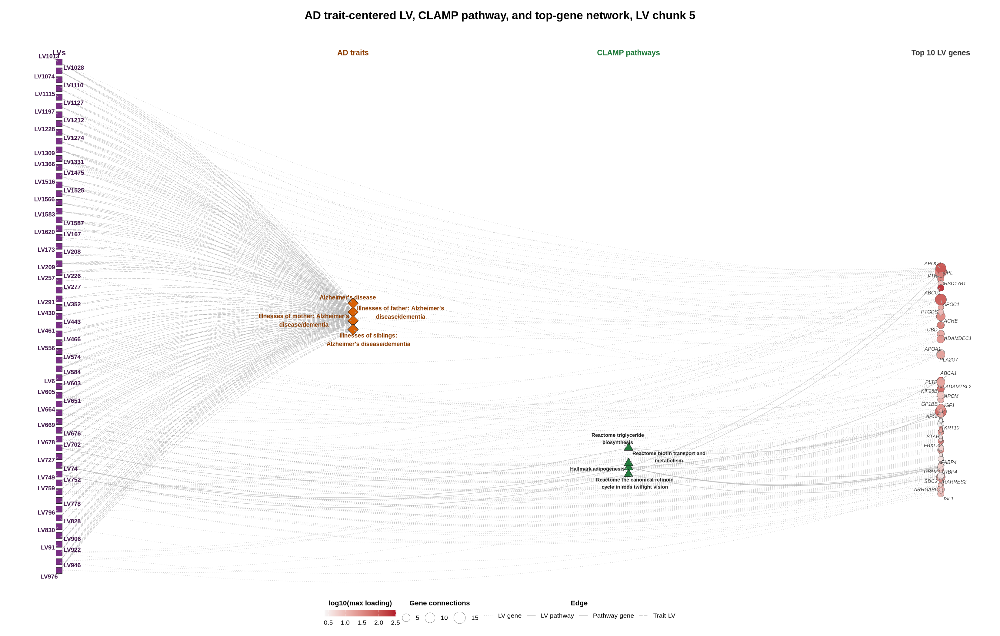

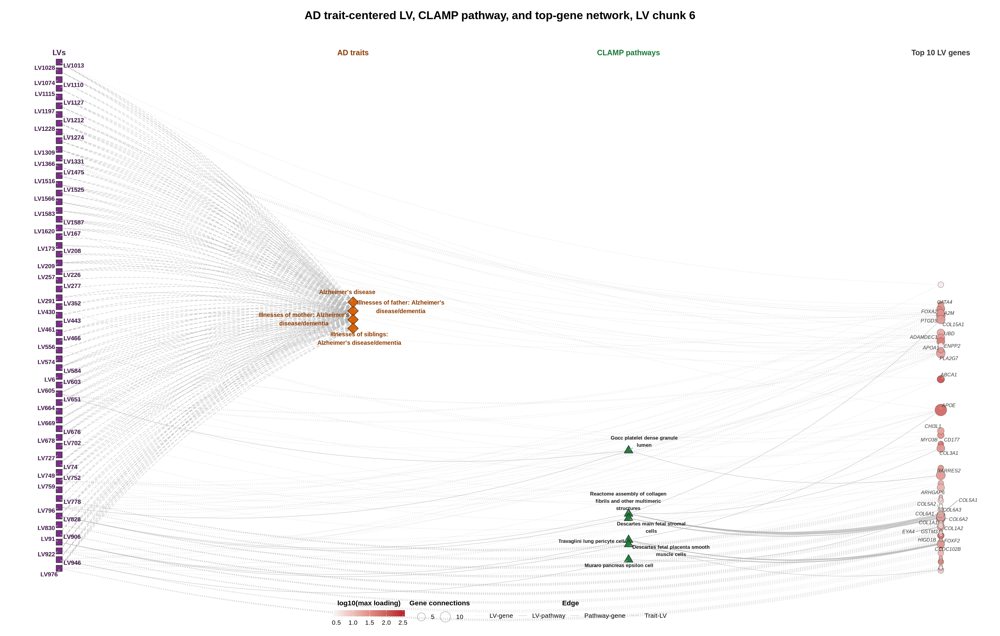

Network PDFs saved to: /home/msubirana/Documents/pivlab/clamp-analyses/output/03_model_biology/00_archs4/01_CRISPRCas9/05_ad_networks 


[1] "paper_mechanism_network.pdf"                  
[2] "ad_lvs_shared_mechanism_summary.pdf"          
[3] "ad_lvs_traits_clamp_gene_pathway_chunk_01.pdf"
[4] "ad_lvs_traits_clamp_gene_pathway_chunk_02.pdf"
[5] "ad_lvs_traits_clamp_gene_pathway_chunk_03.pdf"
[6] "ad_lvs_traits_clamp_gene_pathway_chunk_04.pdf"
[7] "ad_lvs_traits_clamp_gene_pathway_chunk_05.pdf"
[8] "ad_lvs_traits_clamp_gene_pathway_chunk_06.pdf"


In [10]:
out_dir <- here("output/03_model_biology/00_archs4/01_CRISPRCas9/05_ad_networks")
dir.create(out_dir, recursive = TRUE, showWarnings = FALSE)

old_outputs <- list.files(
  out_dir,
  pattern = "^(ad_lvs_clamp|ad_traits_clamp|ad_lvs_traits_clamp|ad_lvs_shared_mechanism).*\\.pdf$",
  full.names = TRUE
)
if (length(old_outputs) > 0) file.remove(old_outputs)

plot_paths <- character()

paper_fig <- make_paper_mechanism_network()
paper_pdf <- file.path(out_dir, "paper_mechanism_network.pdf")
pdf(paper_pdf, width = 22, height = 14)
print(paper_fig)
dev.off()
plot_paths <- c(plot_paths, paper_pdf)

tmp <- tempfile(fileext = ".png")
png(tmp, width = 22, height = 14, units = "in", res = FIG_DPI,
    bg = "white", type = "cairo")
print(paper_fig)
dev.off()
IRdisplay::display_png(file = tmp)

shared_fig <- make_lv_shared_plot()
shared_pdf <- file.path(out_dir, "ad_lvs_shared_mechanism_summary.pdf")
pdf(shared_pdf, width = SUMMARY_FIG_W, height = SUMMARY_FIG_H)
print(shared_fig)
dev.off()
plot_paths <- c(plot_paths, shared_pdf)

tmp <- tempfile(fileext = ".png")
png(tmp, width = SUMMARY_FIG_W, height = SUMMARY_FIG_H, units = "in", res = FIG_DPI,
    bg = "white", type = "cairo")
print(shared_fig)
dev.off()
IRdisplay::display_png(file = tmp)

lv_chunks <- split(LVS, ceiling(seq_along(LVS) / LVS_PER_DETAIL_CHUNK))

for (i in seq_along(lv_chunks)) {
  fig <- make_detail_plot(lv_chunks[[i]], i)
  pdf_path <- file.path(out_dir, sprintf("ad_lvs_traits_clamp_gene_pathway_chunk_%02d.pdf", i))
  pdf(pdf_path, width = DETAIL_FIG_W, height = DETAIL_FIG_H)
  print(fig)
  dev.off()
  plot_paths <- c(plot_paths, pdf_path)

  tmp <- tempfile(fileext = ".png")
  png(tmp, width = DETAIL_FIG_W, height = DETAIL_FIG_H, units = "in", res = FIG_DPI,
      bg = "white", type = "cairo")
  print(fig)
  dev.off()
  IRdisplay::display_png(file = tmp)
  cat("\n")
}

cat("Network PDFs saved to:", out_dir, "\n")
print(basename(plot_paths))


In [11]:
merged_pdf <- file.path(out_dir, "ad_lvs_clamp_networks_all.pdf")
system2("pdftk", args = c(plot_paths, "cat", "output", merged_pdf))
cat("Merged network PDF:", merged_pdf, "\n")


Merged network PDF: /home/msubirana/Documents/pivlab/clamp-analyses/output/03_model_biology/00_archs4/01_CRISPRCas9/05_ad_networks/ad_lvs_clamp_networks_all.pdf 
